# Supplementary figures for laminar thickness covariance and its principal axis

In [1]:
import os, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
import helpers, datasets, surfaces, matrices

sns.set_style('ticks')


DATA_DIR = '../data/'
OUTPUT_DIR = '../output/'
SRC_DIR = '../src/'

/home/asaberi/laminar_gradients/laminar_gradients_conda/lib/python3.9/site-packages/nilearn/datasets/__init__.py:93: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


# 1. Effect of curvature on laminar thickness and laminar thickness covariance before and after smoothing

## Effect of curvature on laminar thickness before and after smoothing

In [2]:
curv_map = surfaces.CurvatureMap(downsampled=True)

In [14]:
midline = datasets.load_parcellation_map('sjh', True, downsampled=True) == 0
curv_map_no_midline = curv_map.surf_data.copy()
curv_map_no_midline[midline] = np.NaN

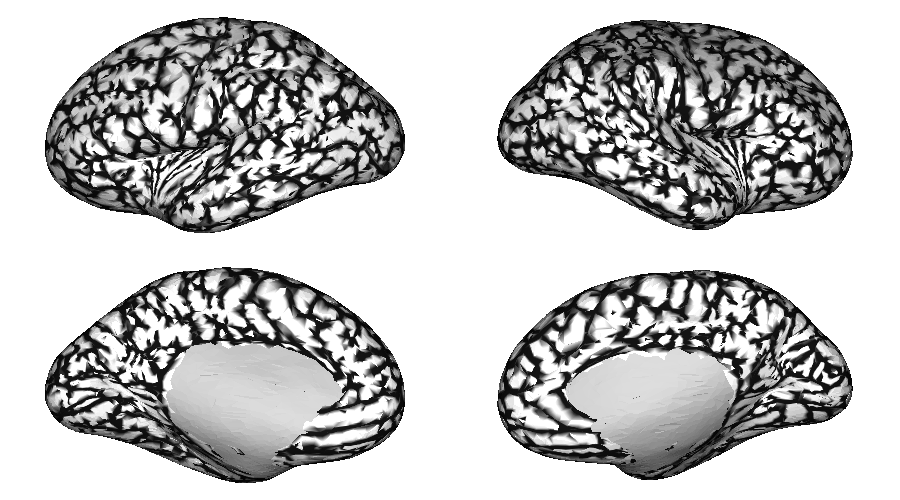

In [16]:
helpers.plot_surface(curv_map_no_midline, vrange=(-0.25, 0.25), cmap='Greys', layout_style='grid')

/home/asaberi/laminar_gradients/code/datasets.py:370: RuntimeWarning:

invalid value encountered in true_divide



Calculating correlations with spin test
Spin permutations already exist
		Batch /home/asaberi/laminar_gradients/code/../src/tpl-bigbrain_desc-spin_indices_downsampled_n-1000.npz
0
100
200
300
400
500
600
700
800
900


<AxesSubplot:>

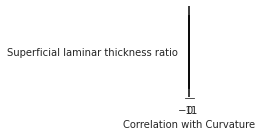

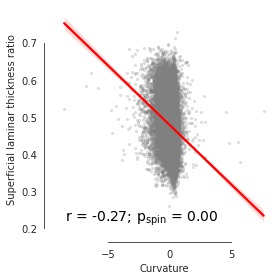

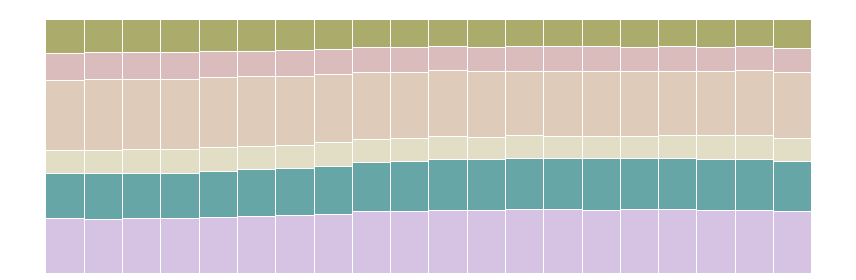

In [3]:
curv_map.effect_on_laminar_thickness(correct_curvature=None)

Calculating correlations with spin test
Spin permutations already exist
		Batch /home/asaberi/laminar_gradients/code/../src/tpl-bigbrain_desc-spin_indices_downsampled_n-1000.npz
999


<AxesSubplot:>

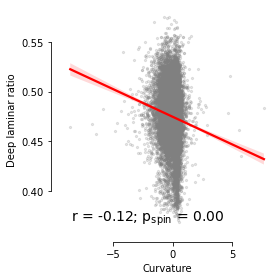

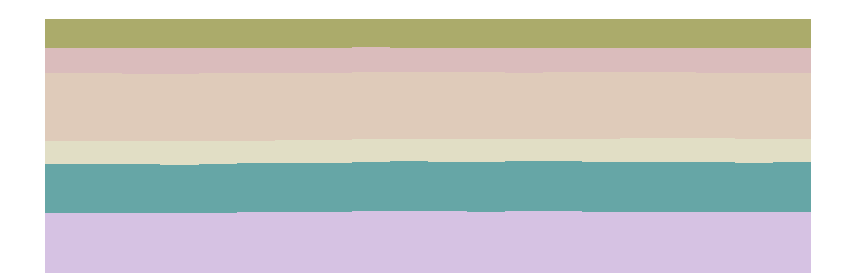

In [4]:
curv_map.effect_on_laminar_thickness(correct_curvature='smooth-10')

### Association of curvature similarity and laminar thickness covariance

In [ ]:
curv_sim = matrices.CurvatureSimilarityMatrix('sjh', exc_regions='adysgranular')

In [2]:
ltc_smooth = matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh', correct_curvature='smooth-10')
ltc_none = matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh', correct_curvature=None)

/home/asaberi/laminar_gradients/laminar_gradients_conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

overflow encountered in reduce



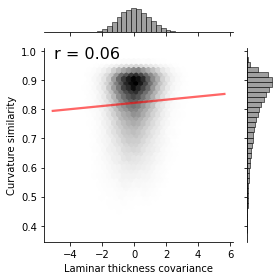

In [4]:
ltc_none.correlate_edge_wise(curv_sim)

/home/asaberi/laminar_gradients/laminar_gradients_conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning:

overflow encountered in reduce



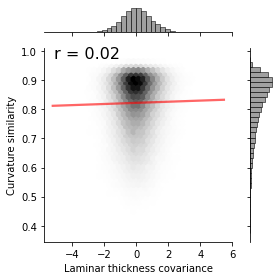

In [5]:
ltc_smooth.correlate_edge_wise(curv_sim)

### Association of LTC G1 with curvature

In [3]:
ltcg_smooth = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh'))
ltcg_none = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh', correct_curvature=None))

Calculating correlations with spin test
Spin permutations already exist
		Batch /home/asaberi/laminar_gradients/code/../src/tpl-bigbrain_desc-spin_indices_downsampled_n-1000.npz
0
100
200
300
400
500
600
700
800
900


(             LTC G1
 Curvature -0.135992,
            LTC G1
 Curvature     0.0)

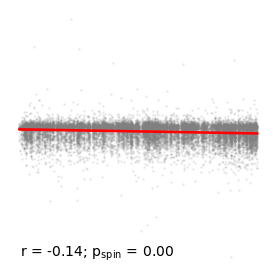

In [5]:
ltcg_none.correlate(curv_map, parcellated=False, n_perm=1000, x_columns=['LTC G1'], axis_off=True)

In [ ]:
ltcg_smooth.correlate(curv_map, parcellated=False, n_perm=1000, x_columns=['LTC G1'], axis_off=True)

# 2. Laminar thickness covariance map for selected regions of interest

Warning: This is very memory-hungry.

In [ ]:
ltc = matrices.MicrostructuralCovarianceMatrix('thickness', None)
ltc._load()
vmin = np.nanquantile(ltc.matrix.values, 0.1)
vmax = np.nanquantile(ltc.matrix.values, 0.9)
out_dir = os.path.join(ltc.dir_path, 'regional_ltc')
os.makedirs(out_dir, exist_ok=True)
brodmann_lh_parcel_centers = helpers.get_parcel_center_indices('brodmann', downsampled=True)['L']
for roi, center_vertex in brodmann_lh_parcel_centers.items():
    print(roi)
    file_path = os.path.join(out_dir, roi)
    center_vertex = brodmann_lh_parcel_centers.loc[roi]
    if not center_vertex in ltc.matrix.index:
        print("LTC for the region is not defined")
        continue
    # get nodal ltc (while taking care of removed vertices)
    nodal_ltc = pd.concat([ltc.matrix.loc[center_vertex], pd.Series(0, index=np.arange(datasets.N_VERTICES_HEM_BB_ICO5*2))], axis=1).iloc[:, 0]
    nodal_ltc = helpers.upsample(nodal_ltc.values)
    helpers.plot_surface(nodal_ltc, file_path, inflate=False, plot_downsampled=False, vrange=(vmin, vmax), cbar=True)

# 3. Robustness of LTC G1 to analytical choices

In [ ]:
## TODO: rewrite this into a series of cells

default_ltcg = surfaces.MicrostructuralCovarianceGradients(
    matrices.MicrostructuralCovarianceMatrix('thickness')
)
res_dir = os.path.join(OUTPUT_DIR, 'ltc', 'gradient_robustness')
os.makedirs(res_dir, exist_ok=True)
res_str = ""
all_ltcgs = []
# parcellations
for parc in [None, 'schaefer1000', 'schaefer400', 'aparc', 'mmp1']:
    res_str += f"Parcellation: {parc}\n"
    curr_ltcg = surfaces.MicrostructuralCovarianceGradients(
        matrices.MicrostructuralCovarianceMatrix('thickness', parcellation_name=parc),
        n_components_report = 1
    )
    all_ltcgs.append(curr_ltcg)
    coefs, pvals = curr_ltcg.correlate(default_ltcg, parcellated=False, x_columns=['LTC G1'], y_columns=['LTC G1'])
    res_str += f'Coefficient: {coefs.iloc[0, 0]}, p-value: {pvals.iloc[0, 0]}\n---\n'
# mask
res_str += "Not removing a-/dysgranular regions"
curr_ltcg = surfaces.MicrostructuralCovarianceGradients(
        matrices.MicrostructuralCovarianceMatrix('thickness', exc_regions=None),
        n_components_report = 1
    )

coefs, pvals = curr_ltcg.correlate(default_ltcg, parcellated=False, x_columns=['LTC G1'], y_columns=['LTC G1'])
res_str += f'Coefficient: {coefs.iloc[0, 0]}, p-value: {pvals.iloc[0, 0]}\n---\n'
# LTC metric
for metric in ['pearson', 'euclidean']:
    res_str += f"LTC metric: {metric}\n"
    curr_ltcg = surfaces.MicrostructuralCovarianceGradients(
        matrices.MicrostructuralCovarianceMatrix('thickness', similarity_metric=metric),
        n_components_report = 1, create_plots = True
    )
    coefs, pvals = curr_ltcg.correlate(default_ltcg, parcellated=False, x_columns=['LTC G1'], y_columns=['LTC G1'])
    res_str += f'Coefficient: {coefs.iloc[0, 0]}, p-value: {pvals.iloc[0, 0]}\n---\n'
# gradient approach
for approach in ['pca', 'le']:
    res_str += f"Gradient approach: {approach}\n"
    curr_ltcg = surfaces.MicrostructuralCovarianceGradients(
        matrices.MicrostructuralCovarianceMatrix('thickness'),
        approach = approach,
        n_components_report = 1, create_plots = True
    )
    coefs, pvals = curr_ltcg.correlate(default_ltcg, parcellated=False, x_columns=['LTC G1'], y_columns=['LTC G1'])
    res_str += f'Coefficient: {coefs.iloc[0, 0]}, p-value: {pvals.iloc[0, 0]}\n---\n'
with open(os.path.join(res_dir, 'gradient_robustness_summary.txt'), 'w') as res_file:
    res_file.write(res_str)
sparsity
ltcg_per_sparsity = {}
for sparsity in np.arange(0, 1, 0.1):
    sparsity = round(sparsity, 2)
    ltcg_per_sparsity[f'Sparsity_{sparsity}'] = surfaces.MicrostructuralCovarianceGradients(
        matrices.MicrostructuralCovarianceMatrix('thickness'),
        sparsity = sparsity,
        n_components_report = 1,
        create_plots = False
    ).surf_data[:, :1]
ltcg_per_sparsity_surf_obj = surfaces.ContCorticalSurface(
    surf_data = np.hstack(ltcg_per_sparsity.values()),
    columns = list(ltcg_per_sparsity.keys()),
    label = 'LTCG with variable sparsity',
    dir_path = res_dir,
)
coefs, pvals = ltcg_per_sparsity_surf_obj.correlate(ltcg_per_sparsity_surf_obj, parcellated = False)
coefs.values[np.triu_indices_from(coefs, 1)] = np.NaN
coefs.index = coefs.columns = range(0, 100, 10)
fig, ax = plt.subplots(figsize=(8, 4))
sns.heatmap(coefs, vmin=0, vmax=1, ax=ax)
ax.set_xlabel('% Sparsity')
ax.set_ylabel('% Sparsity')
fig.tight_layout()
fig.savefig(os.path.join(res_dir, 'coefs.png'))
print(res_str)

# 4. Association of laminar thickness covariance with geodesic distance

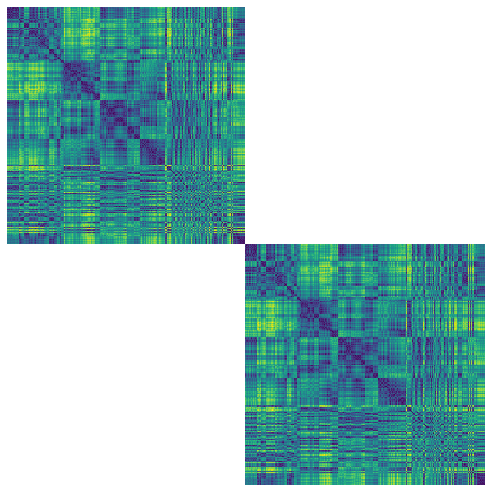

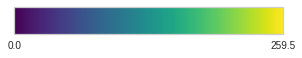

In [ ]:
gd = matrices.DistanceMatrix('sjh', kind='geodesic', exc_regions='adysgranular')
gd.plot(vrange=(0, 1))

R2: 0.16400341715891587


/home/asaberi/laminar_gradients/laminar_gradients_conda/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



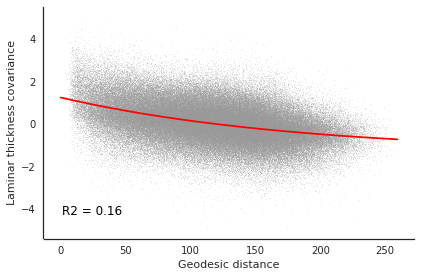

In [ ]:
ltc = matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh')
sns.set_style('white')
_ = gd.regress_out(ltc)
sns.despine(offset=1, left=False, trim=False)

In [ ]:
ltc_gd_reg_out = matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh', regress_out_geodesic_distance=True)

In [ ]:
ltcg_gd_reg_out = surfaces.MicrostructuralCovarianceGradients(ltc_gd_reg_out, n_components_report=1)

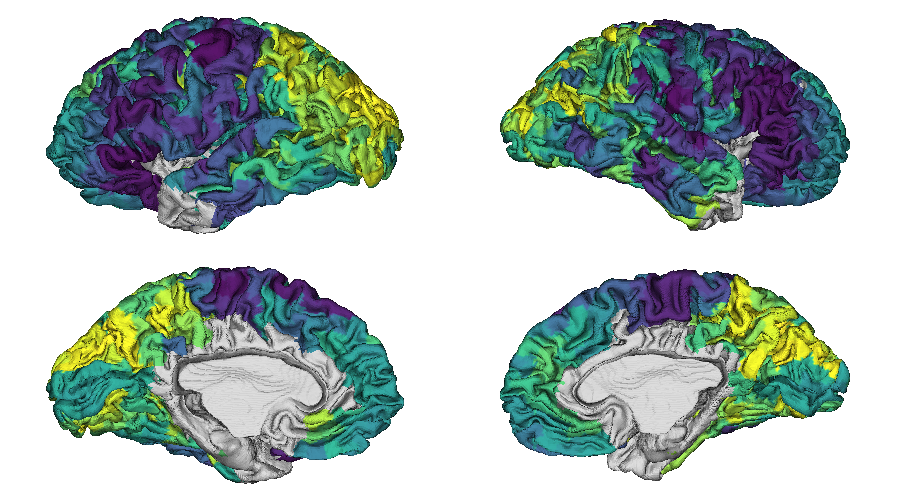

In [ ]:
helpers.plot_surface(helpers.deparcellate(ltcg_gd_reg_out.parcellated_data['LTC G1'], 'sjh'),
                    layout_style='grid', inflate=False, plot_downsampled=False)

Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/ltc/bigbrain_parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor_scale-parcel/gradients_approach-dm_kernel-normalized_angle_sparsity-09_n-10/variogram_surrogates_LTC G1_nperm-1000_nparcels-895.npz and have the same parcels


(          LTC G1
 LTC G1  0.973061,
         LTC G1
 LTC G1     0.0)

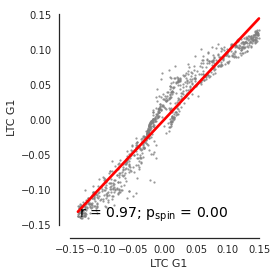

In [ ]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh'))
ltcg.correlate(ltcg_gd_reg_out, n_perm=1000, x_columns=['LTC G1'], y_columns=['LTC G1'], axis_off=False)

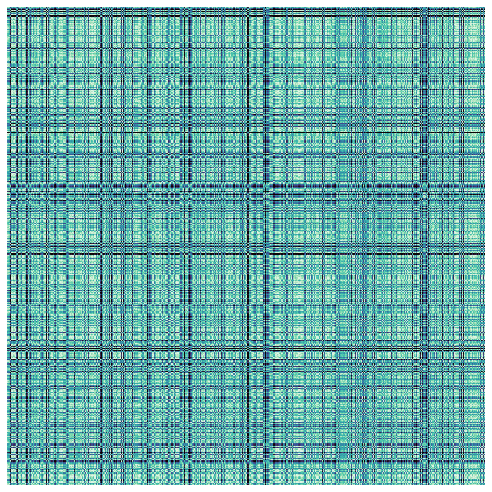

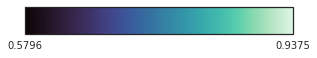

In [ ]:
curv_sim = matrices.CurvatureSimilarityMatrix('sjh')

# 5. K-means clustering of cortical regions based on relative laminar thickness

# 6. The first three axes of laminar thickness variation

In [2]:
ltc = matrices.MicrostructuralCovarianceMatrix('thickness')
ltcg = surfaces.MicrostructuralCovarianceGradients(ltc, n_components_report=3)

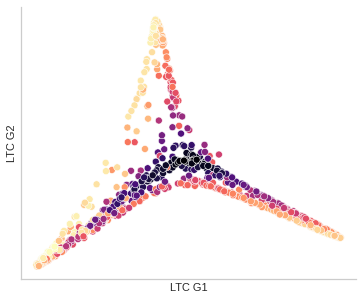

In [3]:
ltcg.plot_scatter()

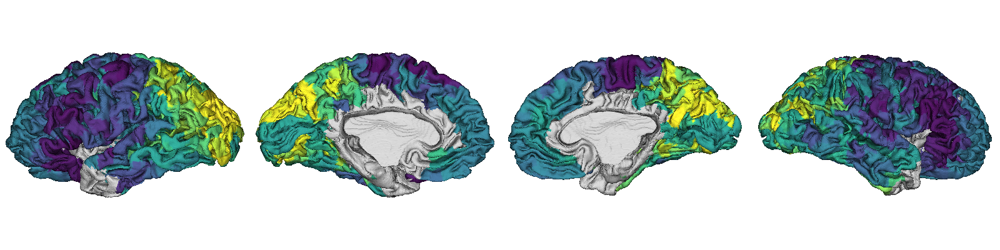

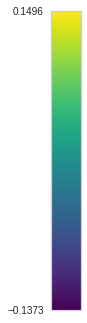

In [5]:
helpers.plot_surface(
    helpers.deparcellate(ltcg.parcellated_data['LTC G1'], 'sjh'),
    cmap='viridis', cbar=True, inflate=False, plot_downsampled=False
)

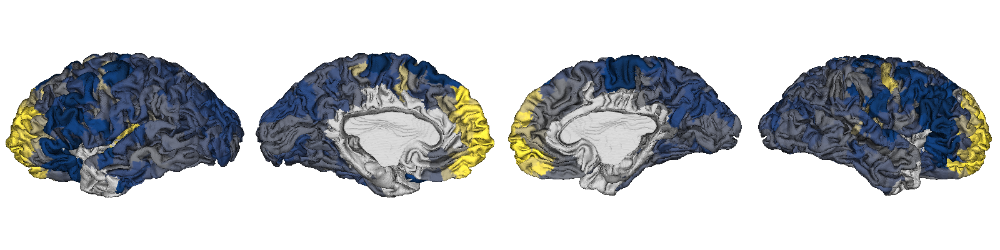

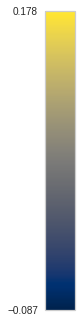

In [8]:
helpers.plot_surface(
    helpers.deparcellate(ltcg.parcellated_data['LTC G2'], 'sjh'),
    cmap='cividis', cbar=True, inflate=False, plot_downsampled=False
)

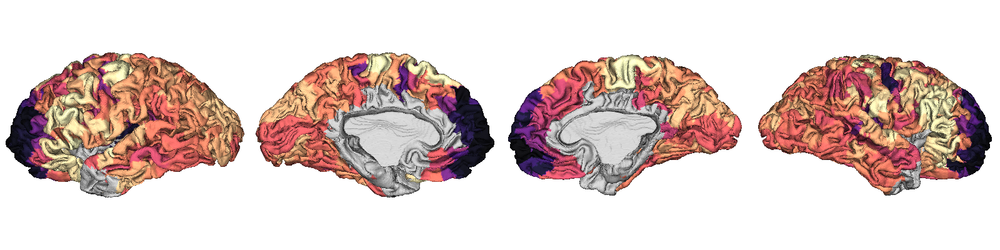

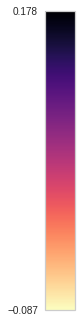

In [16]:
helpers.plot_surface(
    helpers.deparcellate(ltcg.parcellated_data['LTC G2'], 'sjh'),
    cmap='magma_r', cbar=True, inflate=False, plot_downsampled=False
)

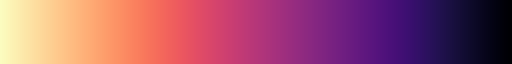

In [5]:
sns.color_palette('magma_r', as_cmap=True)

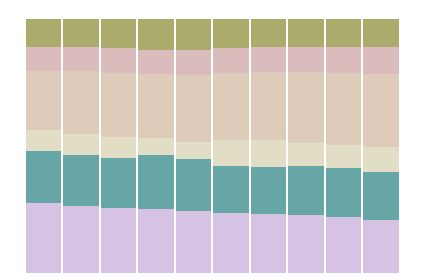

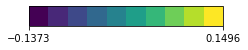

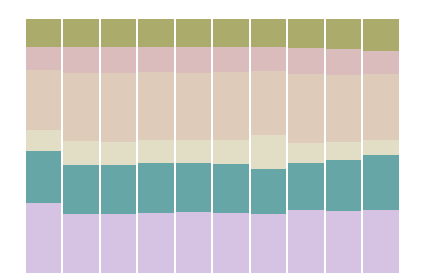

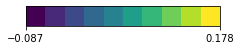

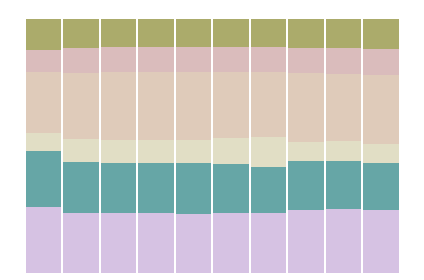

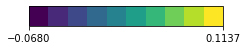

In [7]:
ltcg.plot_binned_profile()

# 7. Laminar thickness covariation along rostrocaudal axis

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/gradients_approach-dm_kernel-normalized_angle_sparsity-09_n-10/variogram_surrogates_LTC G1_nperm-1000_nparcels-895.npz and have the same parcels


(     LTC G1
 X -0.004270
 Y -0.615767
 Z  0.000531,
    LTC G1
 X   0.966
 Y   0.029
 Z   0.999)

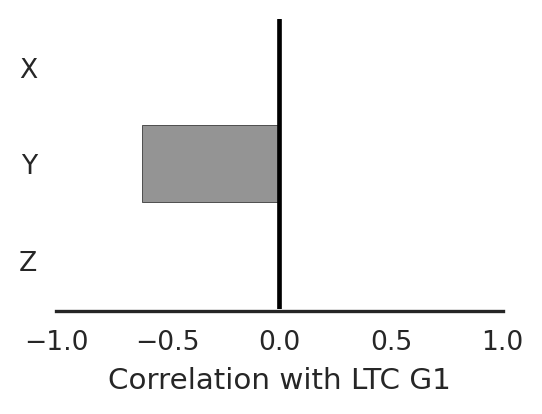

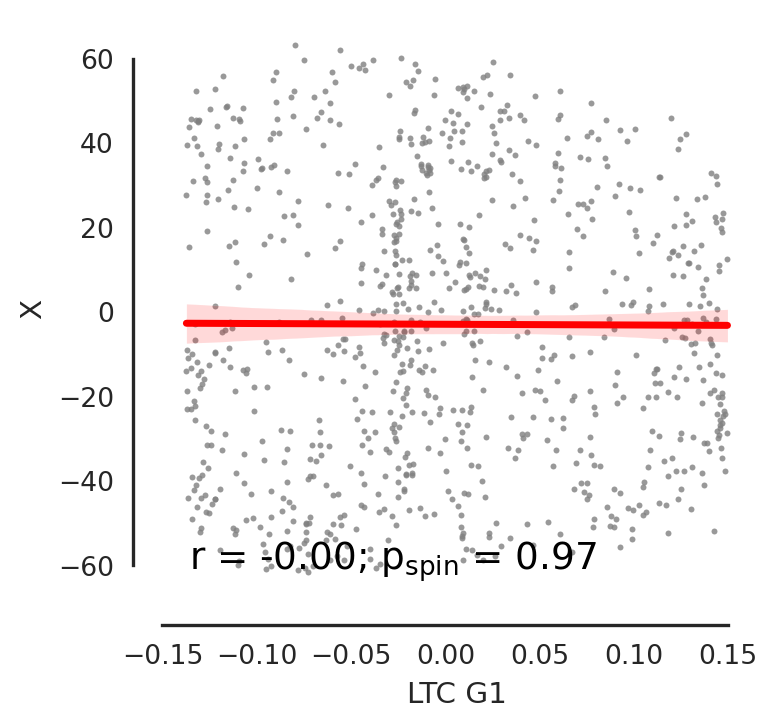

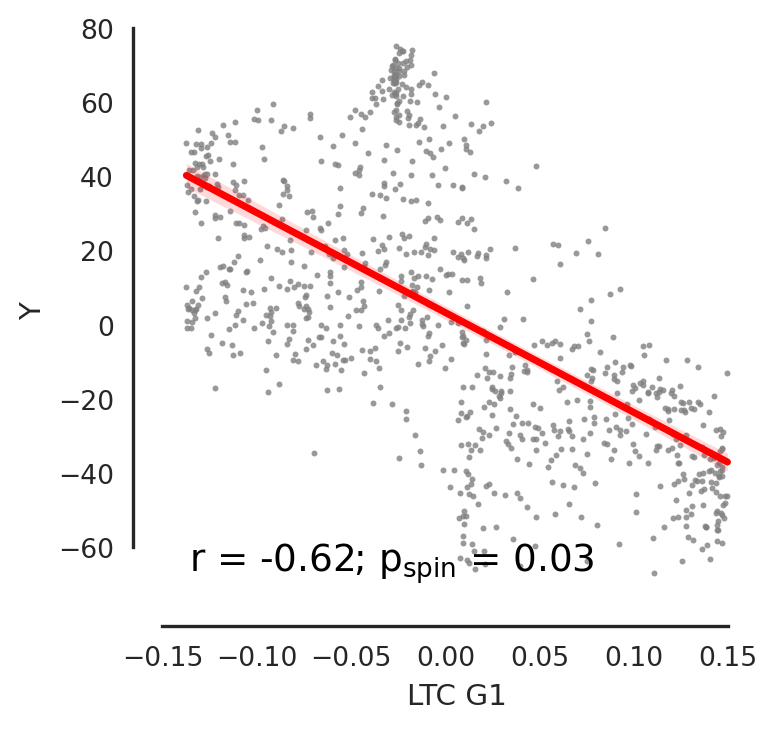

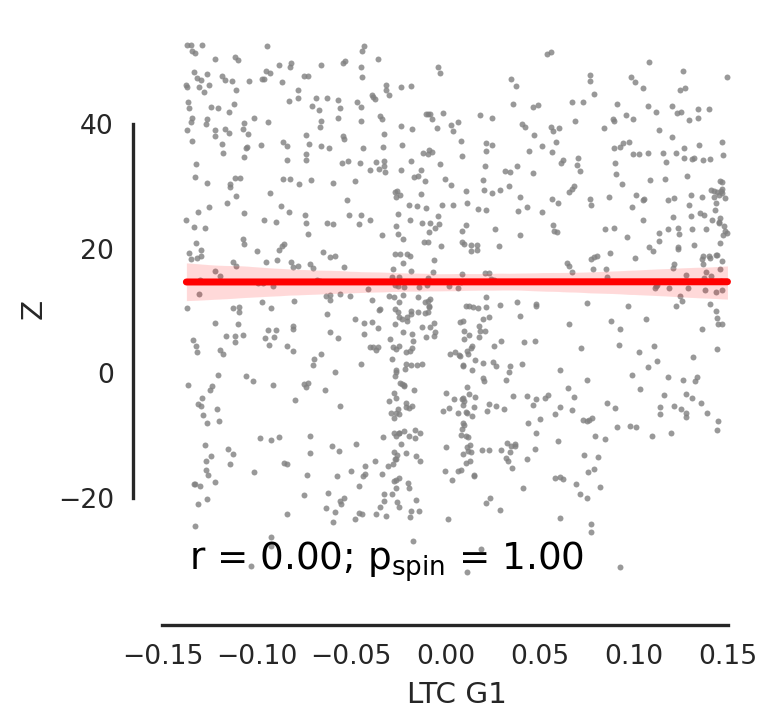

In [3]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh'))
coordinates = surfaces.Coordinates('sjh')
ltcg.correlate(coordinates, x_columns=['LTC G1'])

# 8. Association of laminar thickness covariance with microstructural profile covariance

## a) Microstructural profiles covariance

In [2]:
mpc = matrices.MicrostructuralCovarianceMatrix('density', 'sjh', exc_regions='allocortex')

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/mpc/parc-sjh_exc-allocortex_metric-parcor/matrix.npz


Intensity profile of parcels:

/home/asaberi/laminar_gradients/code/matrices.py:1447: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(concat_parcellated_input_data.index.tolist(), rotation=90)


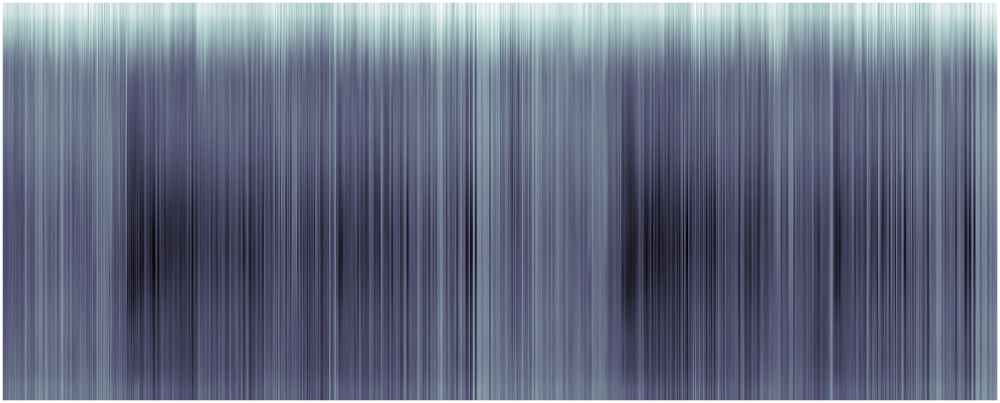

In [3]:
mpc.plot_parcels_profile()

MPC matrix:

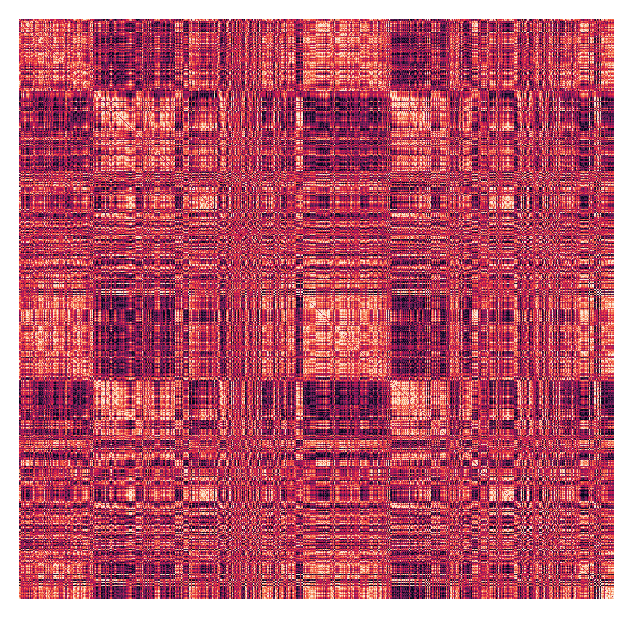

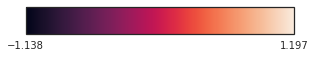

In [4]:
mpc.plot()

## b) MPC G1

In [5]:
mpcg = surfaces.MicrostructuralCovarianceGradients(mpc, n_components_report=1)

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/mpc/parc-sjh_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/mpc/parc-sjh_exc-adysgranular_metric-parcor/matrix.npz


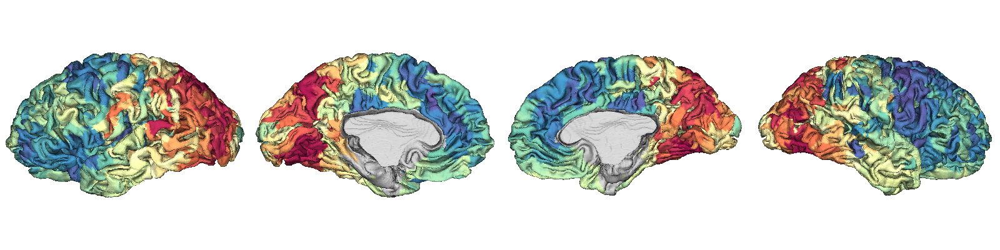

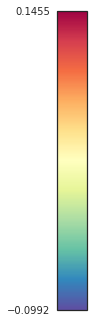

In [6]:
mpcg.plot(columns=['MPC G1'], cbar=True)

## c) Correlation of LTC and MPC

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz


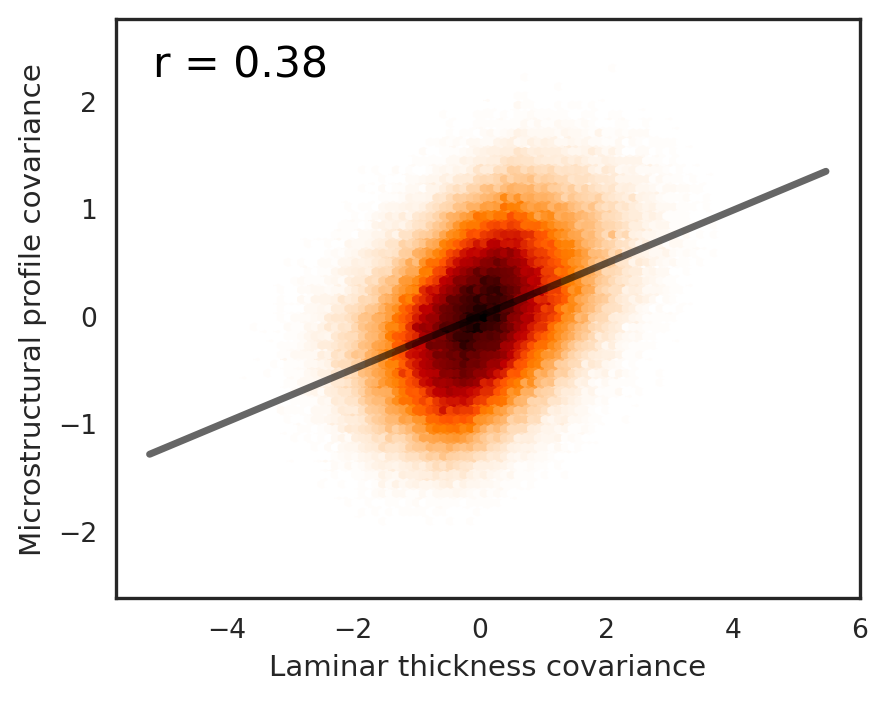

In [7]:
ltc = matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh')
ltc.correlate_edge_wise(mpc, figsize=(5, 4))

## d) Correlation of LTC G1 and MPC G1

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/gradients_approach-dm_kernel-normalized_angle_sparsity-09_n-10/variogram_surrogates_LTC G1_nperm-1000_nparcels-895.npz and have the same parcels


(          LTC G1
 MPC G1  0.637054,
         LTC G1
 MPC G1     0.0)

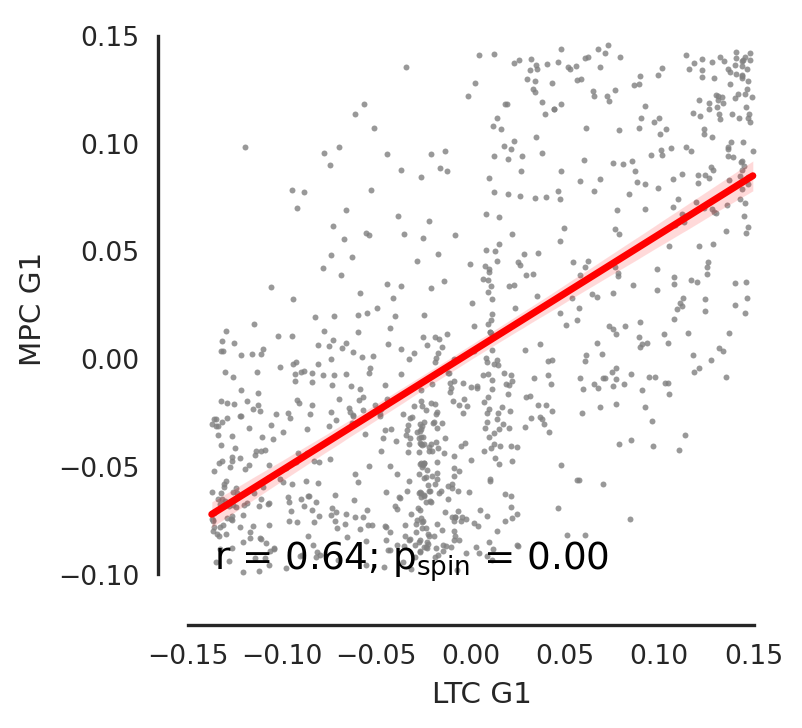

In [8]:
ltcg = surfaces.MicrostructuralCovarianceGradients(ltc)
ltcg.correlate(mpcg, parcellated=True, n_perm=1000, x_columns=['LTC G1'], y_columns=['MPC G1'])

# 9. The principal axis of combined laminar thickness and laminar density covariance matrices

# 10. Association of laminar thickness covariance with the map of cortical types

## a) Cortical types map

In [9]:
ctypes = surfaces.CorticalTypes(exc_regions=None, downsampled=False)

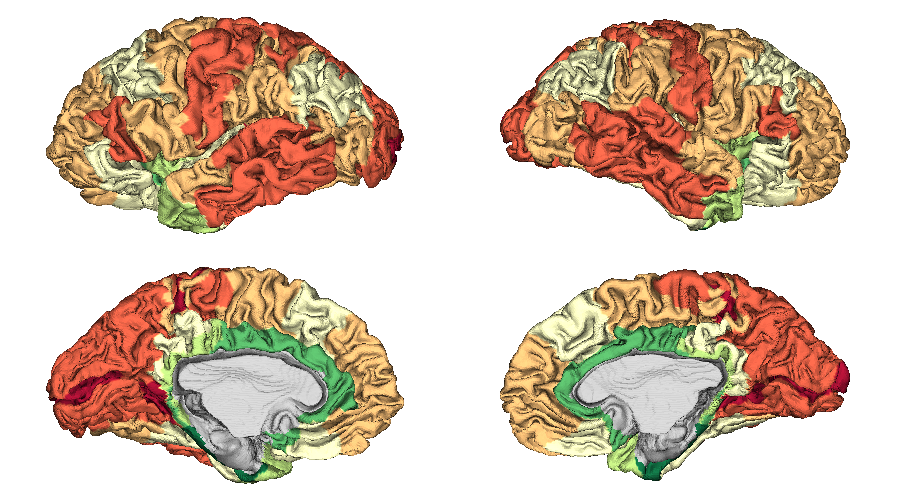

In [10]:
ctypes.plot(layout_style='grid')

## b) Mean LTC based on cortical type similarity

In [11]:
ctypes = surfaces.CorticalTypes(exc_regions='adysgranular', downsampled=False, parcellation_name='sjh')

Calculating p-value with permutation testing (1000 permutations)
Perm 0
Perm 100
Perm 200
Perm 300
Perm 400
Perm 500
Perm 600
Perm 700
Perm 800
Perm 900


,intra,inter,pvals
EU1,0.098424,-0.011920,0.0
EU2,0.184803,-0.040952,0.0
EU3,0.100591,-0.018967,0.0
KO,0.502210,-0.071176,0.0
All,0.142478,-0.023228,0.0


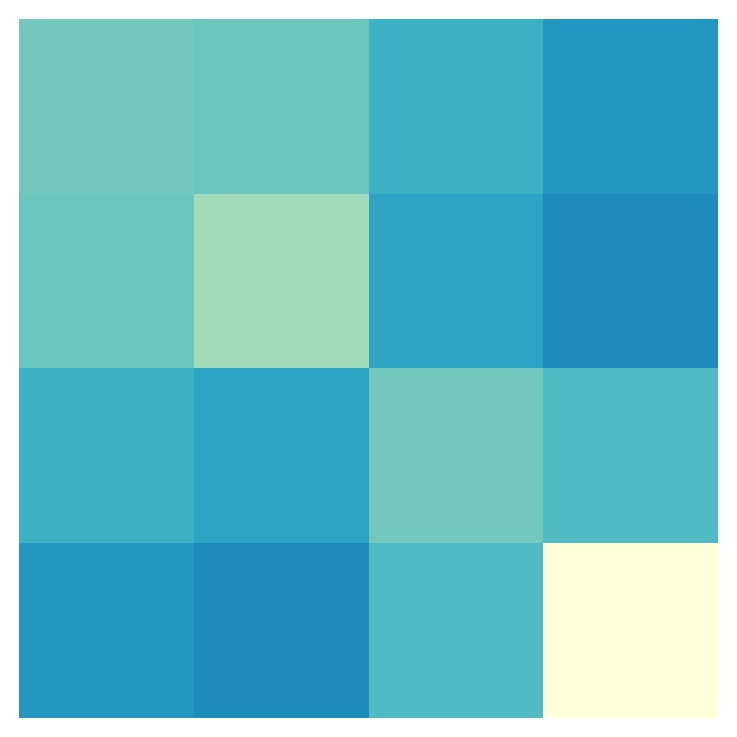

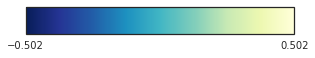

In [12]:
ltc.associate_categorical_surface(ctypes, stats=True)

## c) Cortical types in association to LTC G1

ANOVA Results
--------
----
LTC G1: F statistic 11.874151026030999, pvalue 1.249718937092582e-07
	Post-hoc T-tests passing alpha of 0.008333333333333333:
		EU1 - EU3: T -3.4433084911470555, p 0.0006230891754356493
		EU2 - EU3: T -5.698283628089589, p 1.7940304293568757e-08



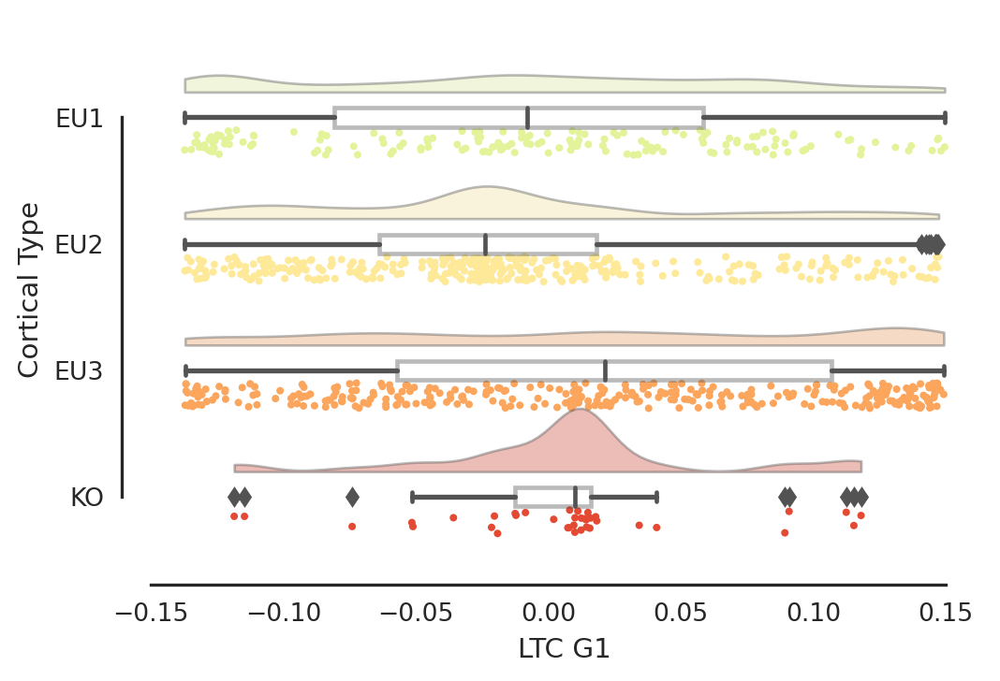

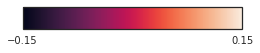

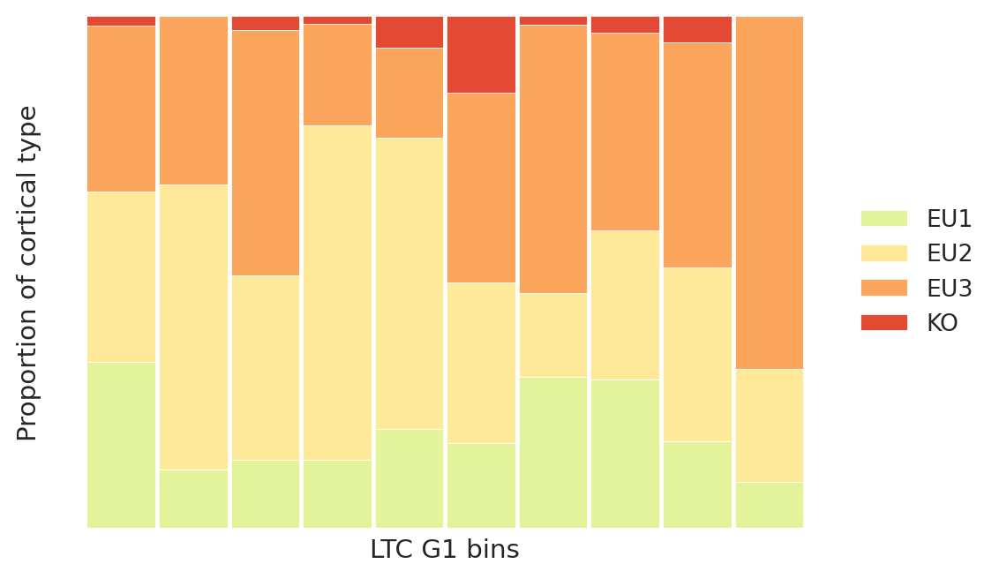

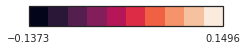

In [13]:
ctypes.compare(ltcg, ['LTC G1'], nbins=10)

# 11. Models of laminar thickness covariation with less than 6 layers

In [2]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh'))

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz


Two-layer model = upper vs lower

In [3]:
laminar_thickness = datasets.load_laminar_thickness('adysgranular', smooth_disc_radius=10)
laminar_thickness = np.concatenate([laminar_thickness['L'], laminar_thickness['R']])

In [4]:
upper_ratio = laminar_thickness[:, :3].sum(axis=1) / laminar_thickness.sum(axis=1)
upper_ratio_sjh = helpers.parcellate(upper_ratio, 'sjh')

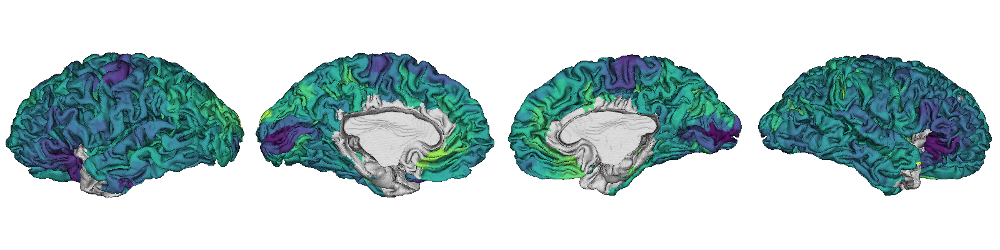

In [6]:
helpers.plot_surface(helpers.deparcellate(upper_ratio_sjh, 'sjh'), inflate=False, plot_downsampled=False)

In [7]:
coef, p, _ = helpers.spin_test_parcellated(ltcg.parcellated_data.iloc[:, :1], upper_ratio_sjh, 'sjh')
print(coef, p, sep='\n')

     LTC G1
0  0.694587
   LTC G1
0     0.0


Three-layer model: 1-3, 4, 5-6

In [7]:
three_layer_thickness = np.concatenate([
    laminar_thickness[:, :3].sum(axis=1)[:, np.newaxis],
    laminar_thickness[:, 3][:, np.newaxis],
    laminar_thickness[:, 4:].sum(axis=1)[:, np.newaxis]
], axis=1)

In [8]:
three_layer_sjh = helpers.parcellate(three_layer_thickness, 'sjh')

In [9]:
def parcor(parcellated_data):
    valid_parcels = parcellated_data[
        ~(parcellated_data.isna().any(axis=1))
    ].index
    parcellated_data = parcellated_data.loc[valid_parcels]

    # calculate partial correlation
    r_ij = np.corrcoef(parcellated_data)
    mean_input_data = parcellated_data.mean()
    r_ic = np.corrcoef(
        parcellated_data.values, 
        mean_input_data.values[np.newaxis, :])[-1, :-1] # r_ic and r_jc are the same
    r_icjc = np.outer(r_ic, r_ic) # the second r_ic is actually r_jc
    matrix = (r_ij - r_icjc) / np.sqrt(np.outer((1-r_ic**2),(1-r_ic**2)))
    # zero out correlations of 1 (to avoid division by 0)
    matrix[np.isclose(matrix, 1)] = 0
    # Fisher's z-transformation
    matrix = 0.5 * np.log((1 + matrix) /  (1 - matrix))
    # zero out NaNs and inf
    matrix[np.isnan(matrix) | np.isinf(matrix)] = 0
    return pd.DataFrame(matrix, index=valid_parcels, columns=valid_parcels)

def pearson(parcellated_data):
    valid_parcels = parcellated_data[
        ~(parcellated_data.isna().any(axis=1))
    ].index
    parcellated_data = parcellated_data.loc[valid_parcels]
    matrix = np.corrcoef(parcellated_data.values)
    # zero out correlations of 1 (to avoid division by 0)
    matrix[np.isclose(matrix, 1)] = 0
    # Fisher's z-transformation
    matrix = 0.5 * np.log((1 + matrix) /  (1 - matrix))
    # zero out NaNs and inf
    matrix[np.isnan(matrix) | np.isinf(matrix)] = 0
    return pd.DataFrame(matrix, index=valid_parcels, columns=valid_parcels)

    
three_layer_ltc = pearson(three_layer_sjh)

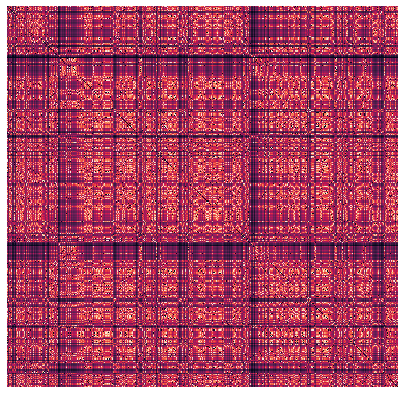

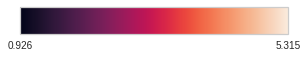

In [24]:
helpers.plot_matrix(three_layer_ltc.values)

In [10]:
def create_gradients(matrix):
    gm = brainspace.gradient.GradientMaps(
                    n_components=10, 
                    approach='dm', 
                    kernel='normalized_angle', 
                    random_state=912
                    )
    gm.fit(matrix.values)
    return pd.DataFrame(
                        gm.gradients_,
                        index=matrix.index,
                        )

three_layer_pearson_gradients = create_gradients(three_layer_ltc)

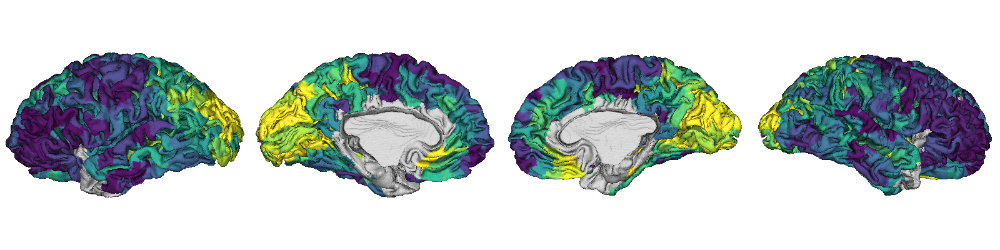

In [11]:
helpers.plot_surface(helpers.deparcellate(three_layer_pearson_gradients, 'sjh')[:, 0], inflate=False, plot_downsampled=False)

In [30]:
coef, p, _ = helpers.spin_test_parcellated(ltcg.parcellated_data.iloc[:, :1], three_layer_pearson_gradients.iloc[:, :1], 'sjh')
print(coef, p, sep='\n')

     LTC G1
0  0.825902
   LTC G1
0     0.0


Four-layer model: 1, 2-3, 4, 5-6

In [12]:
four_layer_thickness = np.concatenate([
    laminar_thickness[:, 0][:, np.newaxis],
    laminar_thickness[:, 1:3].sum(axis=1)[:, np.newaxis],
    laminar_thickness[:, 3][:, np.newaxis],
    laminar_thickness[:, 4:].sum(axis=1)[:, np.newaxis]
], axis=1)
four_layer_sjh = helpers.parcellate(four_layer_thickness, 'sjh')

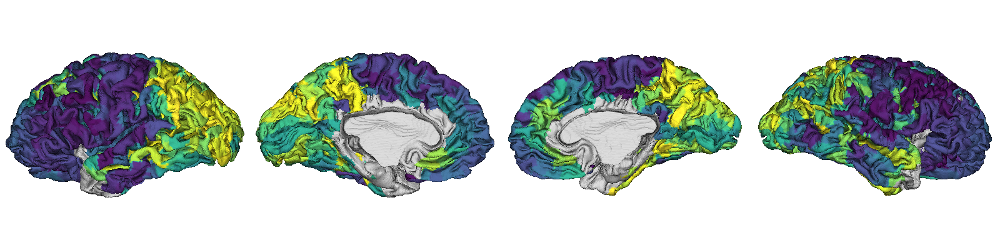

In [13]:
four_layer_ltc = pearson(four_layer_sjh)

four_layer_pearson_gradients = create_gradients(four_layer_ltc)

helpers.plot_surface(helpers.deparcellate(four_layer_pearson_gradients, 'sjh')[:, 0], plot_downsampled=False, inflate=False)

In [38]:
coef, p, _ = helpers.spin_test_parcellated(ltcg.parcellated_data.iloc[:, :1], four_layer_pearson_gradients.iloc[:, :1], 'sjh')
print(coef, p, sep='\n')

     LTC G1
0  0.914829
   LTC G1
0     0.0


Cellular type: 1, 2&4, 3&5, 6

In [43]:
type_layer_thickness = np.concatenate([
    laminar_thickness[:, 0][:, np.newaxis],
    laminar_thickness[:, [1,3]].sum(axis=1)[:, np.newaxis],
    laminar_thickness[:, [2, 4]].sum(axis=1)[:, np.newaxis],
    laminar_thickness[:, 5][:, np.newaxis],
], axis=1)
type_layer_sjh = helpers.parcellate(type_layer_thickness, 'sjh')

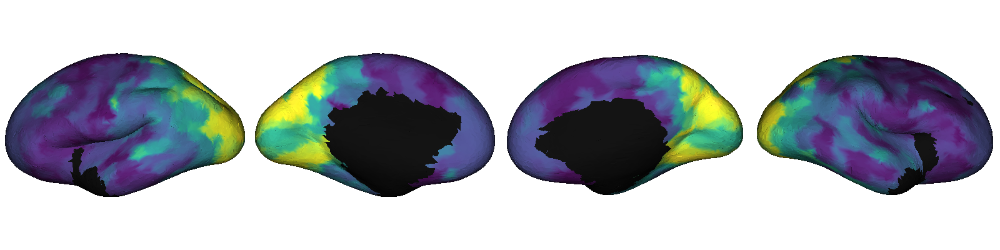

In [44]:
type_layer_ltc = pearson(type_layer_sjh)

type_layer_pearson_gradients = create_gradients(type_layer_ltc)

helpers.plot_surface(helpers.deparcellate(type_layer_pearson_gradients, 'sjh')[:, 0])

In [45]:
coef, p, _ = helpers.spin_test_parcellated(ltcg.parcellated_data.iloc[:, :1], type_layer_pearson_gradients.iloc[:, :1], 'sjh')
print(coef, p, sep='\n')

     LTC G1
0  0.812941
   LTC G1
0     0.0


# 12. Cellular laminar features

In [2]:
samples, laminar_density, laminar_size, laminar_count = datasets.fetch_laminar_cellular_features()

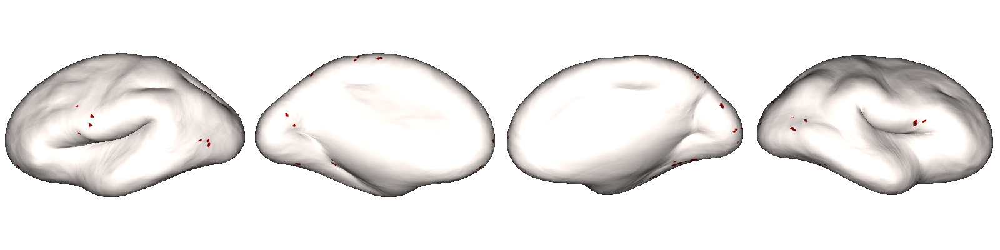

In [98]:
loc = np.zeros(datasets.N_VERTICES_HEM_BB_ICO5 * 2)
loc[samples.index] = 1

helpers.plot_surface(helpers.upsample(loc), cmap='Reds', plot_downsampled=False)

In [99]:
import siibra
atlas = siibra.atlases.MULTILEVEL_HUMAN_ATLAS

v1 = atlas.get_region("v1")
features = siibra.get_features(v1, siibra.modalities.CorticalCellDistribution)
print(f"{len(features)} found for region {v1.name}")

[siibra:INFO] Version: 0.3a26
INFO: Version: 0.3a26
[siibra:WARNING] This is a development release. Use at your own risk.
[siibra:INFO] Please file bugs and issues at https://github.com/FZJ-INM1-BDA/siibra-python.
INFO: Please file bugs and issues at https://github.com/FZJ-INM1-BDA/siibra-python.
[siibra:INFO] No parcellation specified, using default 'Julich-Brain Cytoarchitectonic Maps 2.9'.
INFO: No parcellation specified, using default 'Julich-Brain Cytoarchitectonic Maps 2.9'.
[siibra:WARNING] PREVIEW DATA! CorticalCellDistribution data is only a pre-release snapshot. Contact support@ebrains.eu if you intend to use this data.


10 found for region Area hOc1 (V1, 17, CalcS)


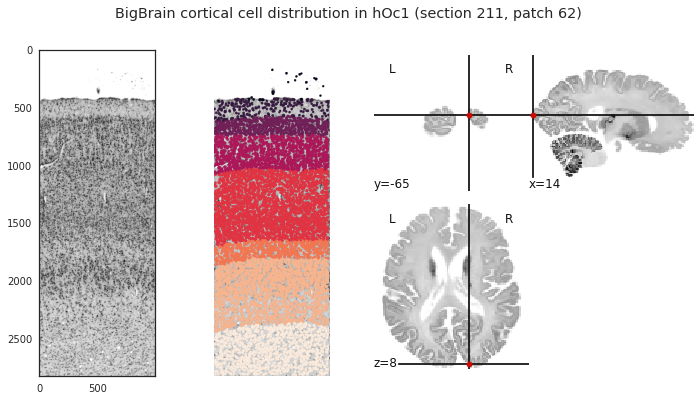

In [102]:
features[0].plot();

In [3]:
ltcg_nonparc = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', None))

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz


In [4]:
samples.loc[:, 'LTCG1'] = ltcg_nonparc.surf_data[samples.index, 0]


 Cellular Density


1   -0.056335
2    0.006008
3    0.156770
4    0.541602
5    0.241033
6    0.251682
Name: LTCG1, dtype: float64


 Cellular Size


1   -0.118649
2   -0.161130
3   -0.280128
4   -0.545764
5   -0.379845
6   -0.306709
Name: LTCG1, dtype: float64

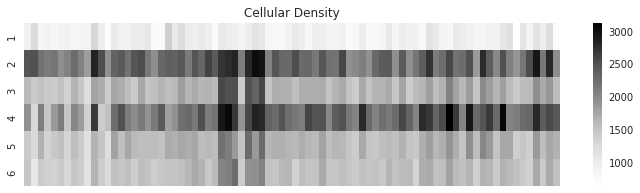

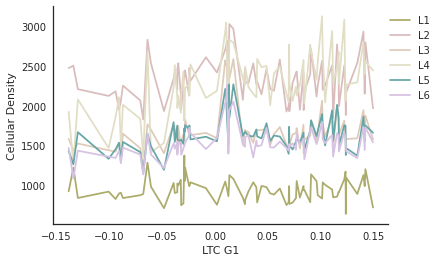

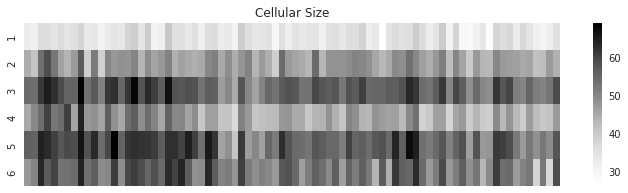

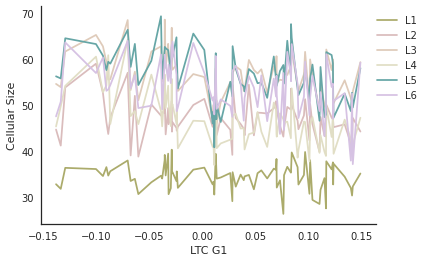

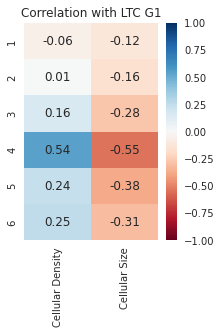

In [107]:
laminar_features = {'cellular density':laminar_density, 'cellular size':laminar_size}
corrs = {}
for name, laminar_feature in laminar_features.items():
    reordered_laminar_feature = laminar_feature.loc[samples.sort_values('LTCG1').index].reset_index(drop=True)
    fig, ax = plt.subplots(1, figsize=(12, 3))
    sns.heatmap(reordered_laminar_feature.T, cmap="Greys", ax=ax)
    ax.set_title(name.title())
    ax.set_xticks([])
    fig, ax = plt.subplots(1, figsize=(6,4))
    for layer in range(1, 7):
        ax.plot(
            samples['LTCG1'].sort_values().values, 
            reordered_laminar_feature.loc[:, str(layer)], 
            color=datasets.LAYERS_COLORS['bigbrain'][layer-1],
        )
    ax.legend([f'L{i}' for i in range(1,7)], bbox_to_anchor=(1.15, 1.0))
    ax.set_xlabel('LTC G1')
    ax.set_ylabel(name.title())
    sns.despine()
    corr = pd.concat([laminar_feature, samples.loc[:, ['LTCG1']]], axis=1).corr().iloc[-1, :-1]
    corrs[name.title()] = corr
    print('\n', name.title())
    display(corr)
    
fig, ax = plt.subplots(1, figsize=(3,4))
ax.set_title('Correlation with LTC G1')
corrs = pd.DataFrame(corrs)
sns.heatmap(corrs, vmin=-1, vmax=1, cmap='RdBu', ax=ax)
for i in range(corrs.shape[0]):
    for j in range(corrs.shape[1]):
        ax.text(j + 0.5, i + 0.5, f'{corrs.iloc[i, j]:.2f}', horizontalalignment='center', verticalalignment='center')

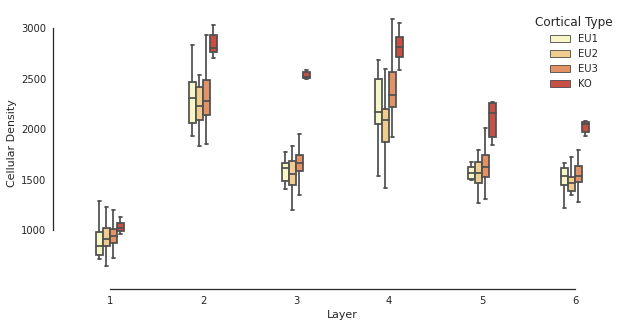

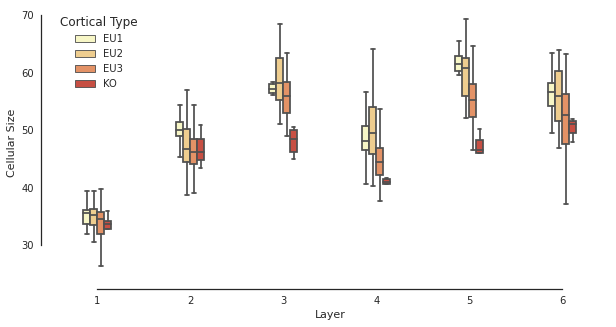

In [62]:
samples.loc[:, 'Cortical Type'] = datasets.load_cortical_types(downsampled=True)[samples.index].values
samples['Cortical Type'] = samples['Cortical Type'].cat.remove_unused_categories()
for name, laminar_feature in laminar_features.items():
    c = laminar_feature.copy()
    c.columns = [f'L{i}' for i in range(1,7)]
    df = pd.wide_to_long(pd.concat([samples, c], axis=1).reset_index(drop=False), 'L', i='bb_vertex', j='Layer')
    fig, ax = plt.subplots(1, figsize=(10,5))
    sns.boxplot(data=df.reset_index(), x='Layer', y='L', hue='Cortical Type', showfliers=False, palette=sns.color_palette("RdYlGn_r", 7)[-4:], width=0.3, ax=ax)
    sns.despine(offset=10, trim=True)
    ax.set_ylabel(name.title())